In [13]:
%pip install swot_ssh_utils
%run /home/vlefoues/swot_ssh_utils.py

DEPRECATION: Loading egg at /home/vlefoues/miniconda3/envs/marlin_conda/lib/python3.11/site-packages/dask-2023.11.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /home/vlefoues/miniconda3/envs/marlin_conda/lib/python3.11/site-packages/locket-1.0.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /home/vlefoues/miniconda3/envs/marlin_conda/lib/python3.11/site-packages/numpy-1.26.2-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /home/

In [1]:
# -*- coding: utf-8 -*-
#add the path to the swot library
import sys
sys.path.append('/home/vlefoues/')
import swot_ssh_utils as swot

#turn off warnings
import warnings
warnings.filterwarnings("ignore")

Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
S

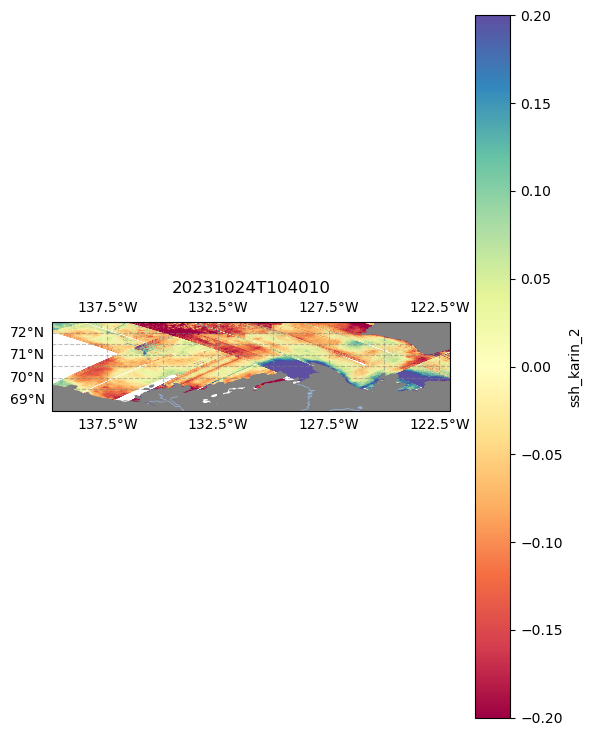

In [2]:
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import swot_ssh_utils as swot
from scipy.interpolate import griddata

# replace the unsmoothed file here
folder="/home/vlefoues/SWOT_Mackenzie_250m/" 

# Get all .nc files in the directory
files = glob.glob(os.path.join(folder, "*.nc"))

# Initialize lists to store SSH_L2 objects and filenames
dds = []
fns = []

# Load data into the class for each file
for file in files:
    dd = swot.SSH_L2()
    dd.load_data(file, lat_bounds=[68,73])
    dds.append(dd)
    fns.append(file)

# Create a map using cartopy
fig, ax = plt.subplots(figsize=(6, 12), subplot_kw=dict(projection=ccrs.PlateCarree()))

# add land, rivers, lakes, and coastlines
land = cfeature.NaturalEarthFeature('physical', 'land', '10m', edgecolor='face', facecolor='gray')
ax.add_feature(land)
ax.add_feature(cfeature.RIVERS, linewidth=0.5)
ax.add_feature(cfeature.LAKES, linewidth=0.5)

# add states and provinces
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='10m',
    facecolor='none')

# Initialize an empty list to store the dtm values
dtms = []
lons = []
lats = []
masks = []

# visualize the data separately for left and right swaths
for dd in dds:
    for tmp in [dd.left, dd.right]:
        #find data points in the open ocean (flag==0)
        #This flag is not always reliable, but it is the best we have for now
        surf=tmp.ancillary_surface_classification_flag==0

        # There is a flag ssh_karin_2_qual that can be used to filter out bad data
        # But it is not always reliable yet in the current products (Dec 1, 2023)
        # This flag is not yet used in the code below, but you can uncomment the following line to check it. 
        #qc_flag=tmp.ssh_karin_2_qual==0 # flag==0 means good data
        
        #mask out non-ocean and bad data
        dtm=np.where(surf,tmp.ssh_karin_2.data,np.nan) 
        
        dtm=dtm-np.nanmin(dtm.flatten()) # this can remove the cross-swath bias 
        
        lon,lat=tmp.longitude.data,tmp.latitude.data
        
        m = ~np.isnan(lon+lat).flatten() # mask out the nan values
        # Append the mask to the masks list
        masks.append(m)

        mss=swot.get_mss22(lon,lat) # get the mean sea surface
        dtm-=mss # remove the mean sea surface 
        
        # the following line find the latitude limit
        # to bound the area for along-track mean removal
        # you can change the bounds to get a better fit for your region. 
        # The 10th column of the lat array is used as an approximate. 
        msk=(lat[:,10]>68)&(lat[:,10]<73)
        
        # remove the along-track mean, the ad hoc way of removing cross-swath bias
        dtm=dtm - np.
        (dtm[msk,:],axis=0)[np.newaxis,:]

        # Print the shape of dtm
        #print(dtm.shape)

        # Append the dtm to the dtms list
        dtms.append(dtm)
        lons.append(lon)
        lats.append(lat)

# plot the data from each file using scatter 
for i in range(len(dds)):
    cax = ax.scatter(lons[i].flatten()[masks[i]], lats[i].flatten()[masks[i]], 
                     c=dtms[i].flatten()[masks[i]], s=0.05, vmin=-0.20,vmax=0.20, 
                     cmap=plt.cm.Spectral ,transform=ccrs.PlateCarree())

# add colorbar and gridlines
gl = ax.gridlines(draw_labels=True, color='gray', 
                  alpha=0.5, linestyle='--')
cbar = plt.colorbar(cax, ax=ax,shrink=0.6)
# remove the right side ylabels
gl.right_labels = False
cbar.set_label('ssh_karin_2')
ax.set_title(fns[0].split('/')[-1].split('_')[7])

# set the extent of the map
lonmin,lonmax,latmin,latmax=np.nanmin(lons[0]),np.nanmax(lons[0]),np.nanmin(lats[0]),np.nanmax(lats[0])
#ax.set_extent([lonmin,lonmax,latmin,latmax], crs=ccrs.PlateCarree())
ax.set_extent([-140,-122,68.5,72.5], crs=ccrs.PlateCarree())

plt.tight_layout()

In [14]:
dd.left

<xarray.Dataset>
Dimensions:                                (num_lines: 2984, num_pixels: 240)
Coordinates:
    latitude                               (num_lines, num_pixels) float64 na...
    longitude                              (num_lines, num_pixels) float64 na...
Dimensions without coordinates: num_lines, num_pixels
Data variables: (12/16)
    time                                   (num_lines) datetime64[ns] ...
    time_tai                               (num_lines) datetime64[ns] ...
    latitude_uncert                        (num_lines, num_pixels) float32 ...
    longitude_uncert                       (num_lines, num_pixels) float32 ...
    polarization_karin                     (num_lines) object ...
    ssh_karin_2                            (num_lines, num_pixels) float64 na...
    ...                                     ...
    sig0_karin_uncert                      (num_lines, num_pixels) float32 ...
    total_coherence                        (num_lines, num_pixels) float32 ...
    mean_sea_surface_cnescls               (num_lines, num_pixels) float64 ...
    miti_power_250m                        (num_lines, num_pixels) float32 ...
    miti_power_var_250m                    (num_lines, num_pixels) float32 ...
    ancillary_surface_classification_flag  (num_lines, num_pixels) float32 na...
Attributes:
    description:  Unsmoothed SSH measurement data and related information for...

Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
S

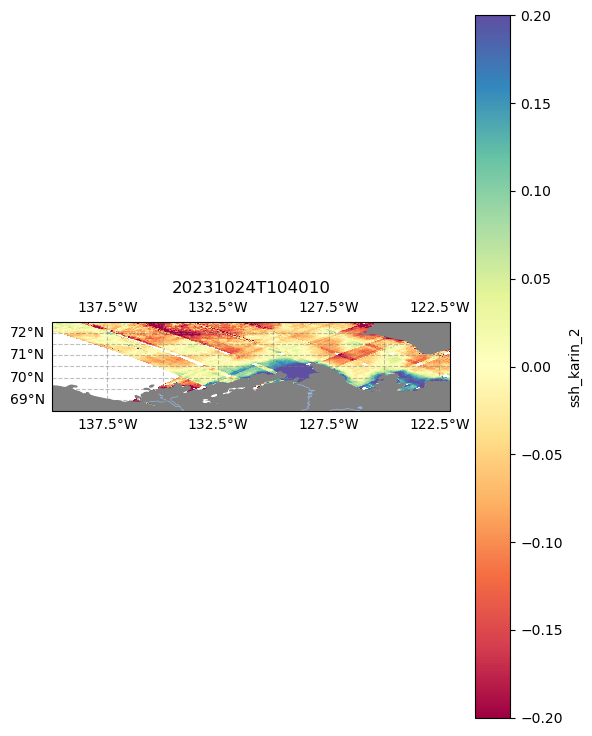

In [3]:
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import swot_ssh_utils as swot
from scipy.interpolate import griddata

folder="/home/vlefoues/SWOT_Mackenzie_250m/23_27" 
files = glob.glob(os.path.join(folder, "*.nc"))

dds = []
fns = []

for file in files:
    dd = swot.SSH_L2()
    dd.load_data(file, lat_bounds=[68,73])
    dds.append(dd)
    fns.append(file)

fig, ax = plt.subplots(figsize=(6, 12), subplot_kw=dict(projection=ccrs.PlateCarree()))

land = cfeature.NaturalEarthFeature('physical', 'land', '10m', edgecolor='face', facecolor='gray')
ax.add_feature(land)
ax.add_feature(cfeature.RIVERS, linewidth=0.5)
ax.add_feature(cfeature.LAKES, linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='10m',
    facecolor='none')

dtms = []
lons = []
lats = []
masks = []

all_lons = []
all_lats = []
all_dtms = []

for dd in dds:
    for tmp in [dd.left, dd.right]:
        surf=tmp.ancillary_surface_classification_flag==0
        dtm=np.where(surf,tmp.ssh_karin_2.data,np.nan) 
        dtm=dtm-np.nanmin(dtm.flatten()) 
        lon,lat=tmp.longitude.data,tmp.latitude.data
        m = ~np.isnan(lon+lat).flatten() 
        masks.append(m)
        mss=swot.get_mss22(lon,lat) 
        dtm-=mss 
        msk=(lat[:,10]>68)&(lat[:,10]<73)
        dtm=dtm - np.nanmean(dtm[msk,:],axis=0)[np.newaxis,:]
        dtms.append(dtm)
        lons.append(lon)
        lats.append(lat)
        all_dtms.append(dtm.flatten()[m])
        all_lons.append(lon.flatten()[m])
        all_lats.append(lat.flatten()[m])

all_lons = np.concatenate(all_lons)
all_lats = np.concatenate(all_lats)
all_dtms = np.concatenate(all_dtms)

lon_bins = np.linspace(np.min(all_lons), np.max(all_lons), 1000)
lat_bins = np.linspace(np.min(all_lats), np.max(all_lats), 1000)

hist, lon_edges, lat_edges = np.histogram2d(all_lons, all_lats, bins=[lon_bins, lat_bins], weights=all_dtms)
count, _, _ = np.histogram2d(all_lons, all_lats, bins=[lon_bins, lat_bins])

mean_dtm = hist / count

lon_grid, lat_grid = np.meshgrid((lon_edges[:-1] + lon_edges[1:]) / 2, (lat_edges[:-1] + lat_edges[1:]) / 2)

for i in range(len(dds)):
    cax = ax.pcolormesh(lon_grid, lat_grid, mean_dtm.T, vmin=-0.20, vmax=0.20, cmap=plt.cm.Spectral, transform=ccrs.PlateCarree())

gl = ax.gridlines(draw_labels=True, color='gray', 
                  alpha=0.5, linestyle='--')
cbar = plt.colorbar(cax, ax=ax,shrink=0.6)
gl.right_labels = False
cbar.set_label('ssh_karin_2')
ax.set_title(fns[0].split('/')[-1].split('_')[7])

lonmin,lonmax,latmin,latmax=np.nanmin(lons[0]),np.nanmax(lons[0]),np.nanmin(lats[0]),np.nanmax(lats[0])
ax.set_extent([-140,-122,68.5,72.5], crs=ccrs.PlateCarree())

plt.tight_layout()

3.8.0
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.right
Subset data between latitude bounds  [68, 73]
Load unsmoothed data to self.left and self.r

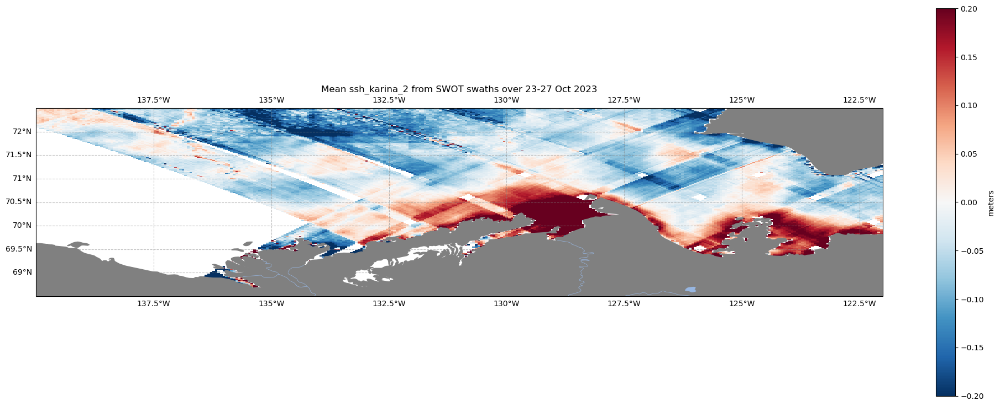

In [4]:
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import swot_ssh_utils as swot
from scipy.interpolate import griddata
import matplotlib.colors as colors
import matplotlib
print(matplotlib.__version__)

folder="/home/vlefoues/SWOT_Mackenzie_250m/23_27" 
files = glob.glob(os.path.join(folder, "*.nc"))

dds = []
fns = []

for file in files:
    dd = swot.SSH_L2()
    dd.load_data(file, lat_bounds=[68,73])
    dds.append(dd)
    fns.append(file)

fig, ax = plt.subplots(figsize=(20, 12), subplot_kw=dict(projection=ccrs.PlateCarree()))

land = cfeature.NaturalEarthFeature('physical', 'land', '10m', edgecolor='face', facecolor='gray')
ax.add_feature(land)
ax.add_feature(cfeature.RIVERS, linewidth=0.5)
ax.add_feature(cfeature.LAKES, linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='10m',
    facecolor='none')

dtms = []
lons = []
lats = []
masks = []

all_lons = []
all_lats = []
all_dtms = []

for dd in dds:
    for tmp in [dd.left, dd.right]:
        surf=tmp.ancillary_surface_classification_flag==0
        dtm=np.where(surf,tmp.ssh_karin_2.data,np.nan) 
        dtm=dtm-np.nanmin(dtm.flatten()) 
        lon,lat=tmp.longitude.data,tmp.latitude.data
        m = ~np.isnan(lon+lat).flatten() 
        masks.append(m)
        mss=swot.get_mss22(lon,lat) 
        dtm-=mss 
        msk=(lat[:,10]>68)&(lat[:,10]<73)
        dtm=dtm - np.nanmean(dtm[msk,:],axis=0)[np.newaxis,:]
        dtms.append(dtm)
        lons.append(lon)
        lats.append(lat)
        all_dtms.append(dtm.flatten()[m])
        all_lons.append(lon.flatten()[m])
        all_lats.append(lat.flatten()[m])

all_lons = np.concatenate(all_lons)
all_lats = np.concatenate(all_lats)
all_dtms = np.concatenate(all_dtms)

lon_bins = np.linspace(np.min(all_lons), np.max(all_lons), 1000)
lat_bins = np.linspace(np.min(all_lats), np.max(all_lats), 1000)

hist, lon_edges, lat_edges = np.histogram2d(all_lons, all_lats, bins=[lon_bins, lat_bins], weights=all_dtms)
count, _, _ = np.histogram2d(all_lons, all_lats, bins=[lon_bins, lat_bins])

mean_dtm = hist / count

lon_grid, lat_grid = np.meshgrid((lon_edges[:-1] + lon_edges[1:]) / 2, (lat_edges[:-1] + lat_edges[1:]) / 2)

from matplotlib.colors import TwoSlopeNorm

# Create a colormap that diverges from blue to red centered at zero
cmap = plt.cm.get_cmap('RdBu_r')
norm = TwoSlopeNorm(vmin=-0.20, vcenter=0, vmax=0.20)

for i in range(len(dds)):
    cax = ax.pcolormesh(lon_grid, lat_grid, mean_dtm.T, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())

gl = ax.gridlines(draw_labels=True, color='gray', 
                  alpha=0.5, linestyle='--')
cbar = plt.colorbar(cax, ax=ax,shrink=0.6, cmap=cmap, norm=norm)
gl.right_labels = False
#cbar.set_label('ssh_karin_2')
cbar.set_label('meters')    
#ax.set_title(fns[0].split('/')[-1].split('_')[7])
ax.set_title('Mean ssh_karina_2 from SWOT swaths over 23-27 Oct 2023')

lonmin,lonmax,latmin,latmax=np.nanmin(lons[0]),np.nanmax(lons[0]),np.nanmin(lats[0]),np.nanmax(lats[0])
ax.set_extent([-140,-122,68.5,72.5], crs=ccrs.PlateCarree())

plt.tight_layout()

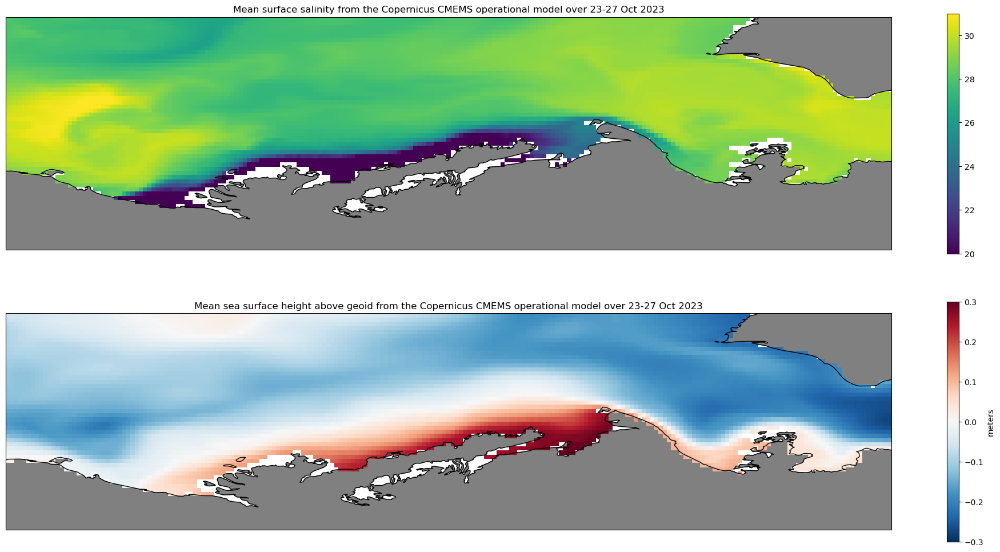

In [5]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Open the netCDF file - Global from CMEMS (https://data.marine.copernicus.eu/product/GLOBAL_ANALYSISFORECAST_PHY_001_024/description)
# Info on the model configuration can be found here: https://catalogue.marine.copernicus.eu/documents/PUM/CMEMS-GLO-PUM-001-024.pdf
# Rivers from Dai et al., 2009
ds1 = xr.open_dataset('/home/vlefoues/SWOT_Mackenzie_250m/cmems/cmems_mod_glo_phy-so_anfc_0.083deg_P1D-m_1718099484843.nc')
ds2 = xr.open_dataset('/home/vlefoues/SWOT_Mackenzie_250m/cmems/cmems_mod_glo_phy_myint_0.083deg_P1D-m_1718104533825.nc')

# Select the 'so' variable
#so = ds1['so'].isel(time=0) plot time step 1
so = ds1['so'].mean(dim='time')
zos = ds2['zos'].mean(dim='time')

# Create a new figure
fig, axs = plt.subplots(nrows=2, figsize=(25, 12), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the 'so' variable
vmin = 20
vmax = 31
so_plot = so.plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, vmin=vmin, vmax=vmax)
plt.colorbar(so_plot, ax=axs[0], label='')
axs[0].coastlines()
axs[0].add_feature(cfeature.LAND, color='grey')
axs[0].set_title('Mean surface salinity from the Copernicus CMEMS operational model over 23-27 Oct 2023')

# Plot the 'zos' variable
# Plot the 'zos' variable
wmin = -0.3
wmax = +0.3
zos_plot = zos.plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, vmin=wmin, vmax=wmax, cmap='RdBu_r')
plt.colorbar(zos_plot, ax=axs[1], label='meters')
axs[1].coastlines()
axs[1].add_feature(cfeature.LAND, color='grey')
axs[1].set_title('Mean sea surface height above geoid from the Copernicus CMEMS operational model over 23-27 Oct 2023')

# Show the plot
plt.show()

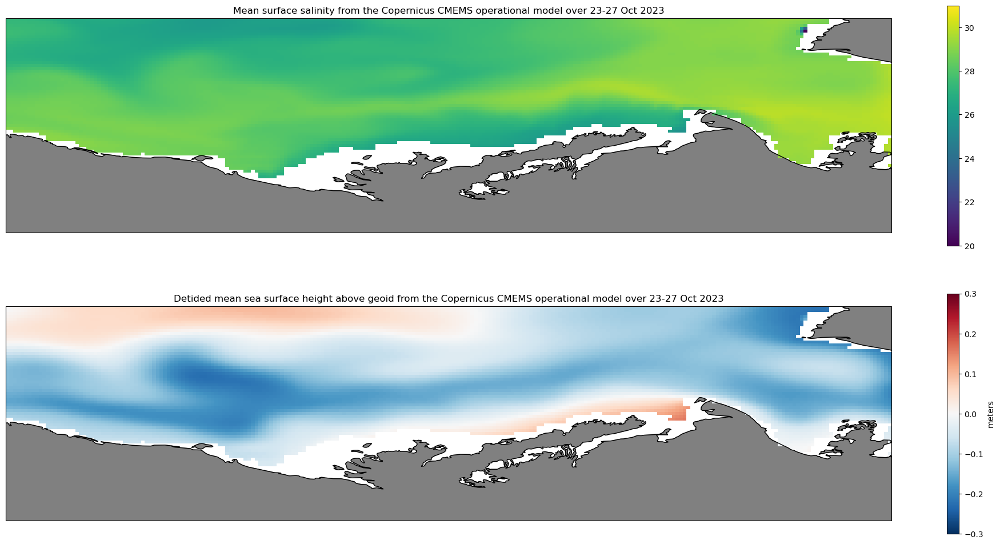

In [6]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Open the netCDF file - Arctic detided data from CMEMS (https://data.marine.copernicus.eu/viewer/expert?view=dataset&dataset=ARCTIC_ANALYSISFORECAST_PHY_002_001)
# Info on the model configuration can be found here: https://catalogue.marine.copernicus.eu/documents/QUID/CMEMS-ARC-QUID-002-001.pdf
# River discharge is a monthly climatology from the Arctic and European configurations of the Hydrological Predictions for the Environment (HYPE) model (Lindström et al., 2010)
ds = xr.open_dataset('/home/vlefoues/SWOT_Mackenzie_250m/cmems/cmems_mod_arc_phy_anfc_6km_detided_P1D-m_1718195063040.nc')

# Select the 'so' variable
#so = ds1['so'].isel(time=0) plot time step 1
so = ds['so'].mean(dim='time')
zos = ds['zos'].mean(dim='time')

# Create a new figure
fig, axs = plt.subplots(nrows=2, figsize=(25, 12), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the 'so' variable
# Define the min and max values for the colorbar
vmin = 20
vmax = 31
so_plot = so.plot(ax=axs[0], transform=ccrs.PlateCarree(), add_colorbar=False, vmin=vmin, vmax=vmax)
plt.colorbar(so_plot, ax=axs[0], label='')
axs[0].coastlines()
axs[0].add_feature(cfeature.LAND, color='grey')
axs[0].set_title('Mean surface salinity from the Copernicus CMEMS operational model over 23-27 Oct 2023')

# Plot the 'zos' variable
wmin = -0.3
wmax = +0.3
zos_plot = zos.plot(ax=axs[1], transform=ccrs.PlateCarree(), add_colorbar=False, vmin=wmin, vmax=wmax, cmap='RdBu_r')
plt.colorbar(zos_plot, ax=axs[1], label='meters')
axs[1].coastlines()
axs[1].add_feature(cfeature.LAND, color='grey')
axs[1].set_title('Detided mean sea surface height above geoid from the Copernicus CMEMS operational model over 23-27 Oct 2023')

# Show the plot
plt.show()

In [ ]:
%pip install pyhdf

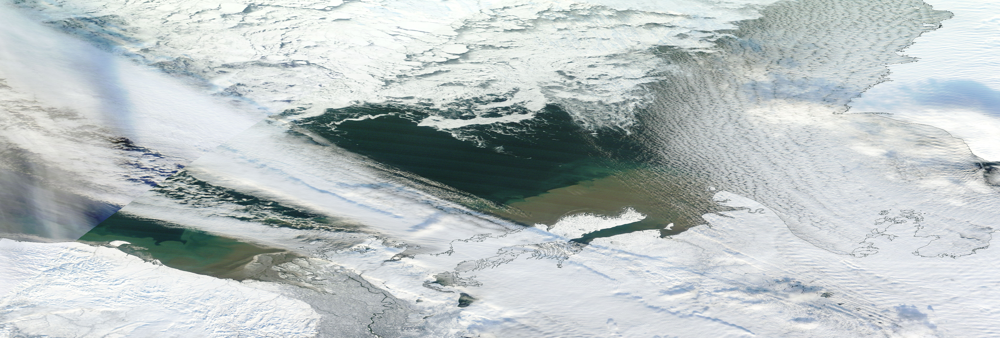

In [8]:
from IPython.display import Image

# Replace 'path_to_your_image.png' with the actual path to your PNG image
Image('/home/vlefoues/SWOT_Mackenzie_250m/truecolor/snapshot-2023-10-23T00_00_00Z.png')

